### ECE/CS/ISyE 524 &mdash; Introduction to Optimization &mdash; Spring 2022 ###

# Madison Metro Transit #

#### Agam Goyal (agoyal25@wisc.edu), Ankur Garg (agarg34@wisc.edu), and Erik Thomas Gessner (egessner@wisc.edu)

*****

### Table of Contents

1. [Introduction](#1.-Introduction)
1. [Mathematical Model](#2.-Mathematical-model)
1. [Solution](#3.-Solution)
1. [Results and Discussion](#4.-Results-and-discussion)
1. [Conclusion](#5.Conclusion)

## 1. Introduction ##

Optimization techniques are a brilliant way of modelling various real-life scenarios and play with their behavior in an attempt to improve their working in the real world. In this project, we use a linear program [\[1\]](https://www.analyticsvidhya.com/blog/2017/02/lintroductory-guide-on-linear-programming-explained-in-simple-english/) to model the bus transit system of the city of Madison in Wisconsin with goals of minimizing the average travel time of passengers while also minimizing the fuel consumption costs for the Madison Metro Bus Transit authorities. 

Madison Metro Transit plans to redesign its bus system by August 2023. They're looking to increase access and bus frequency and decrease travel times to better meet the needs of Madison-area residents and businesses, while also being cost effective as per the proposed budget for the project.

Metro Transit transportation planner Mike Cechvala emphasizes on the need for this change as there hasn't been any significant remodeling of the system in the last two decades [\[2\]](https://badgerherald.com/news/2021/04/12/madison-metro-transit-plans-for-bus-system-redesign-to-improve-overall-quality/#:~:text=Madison%20Metro%20Transit%20will%20redesign,the%20experience%20of%20transit%20riders). He outlines some major problems in the Metro system which need to be solved. Some of these include cutting down on overlapping routes and replacing them with ones that serve the city more efficiently. Decreasing travel time will reduce vehicle miles and encourage a shift from cars to buses, which would also be in the interest of the environment.

It has also been seen that the ridership has slowly declined for the last six years, with an even greater impact seen in the last couple of years due to COVID-19. We believe that a more efficient system will increase ridership and will allow Metro Transit to live up to its classification as a high-performing system, similar to bus systems in larger cities like Chicago and New York.

The data for this problem we wish to solve comes from the City of Madison Open Data [\[3\]](https://data-cityofmadison.opendata.arcgis.com/) hub. We use three different datasets and utilize them to help us model this problem efficiently. The first is the ridership details of passengers for weekdays, the second is the ridership details by intersections (which are also for weekdays), and the final one is ridership details by stops.

In the upcoming sections of the report, we go over the mathematical optimization model we developed in detail, the solution our model gives us and also its results, and their analysis. Finally we come to a conclusion regarding our results and reflect on what might be some potential pitfalls and things to work on for the future.

<div>
   <img src="https://madisoncommons.org/wp-content/uploads/2020/09/August-2020-Weekday-Service-Map.jpg" width="700">
</div>

## 2. Mathematical model ##

In order to represent the flow of passengers in a bus-network, we modeled this problem as a min-cost flow problem. Our goal was to minimize the transportation costs while preserving the current flow of passengers allowed by the bus network. We defined the nodes to be the current intersections served by the bus system and generated a fully connected graph between all nodes. We then used our estimated movement pattern to create a unique type flow for each passenger to enforce the current flows constraints. We then used the squared distance between intersections to estimate the cost. Because this is a min-cost network flow problem, it is a Linear Program (LP).

$$
\newcommand{\QQ}{\mathbb{Q}}
\newcommand{\RR}{\mathbb{R}}
\newcommand{\NN}{\mathbb{N}}
\newcommand{\ZZ}{\mathbb{Z}}
\newcommand{\PP}{\mathbb{P}}
\newcommand{\E}{\mathrm{E}}
\newcommand{\Var}{\mathrm{Var}}
\newcommand{\Cov}{\mathrm{Cov}}
\newcommand{\N}{\mathcal{N}}
\newcommand{\T}{\mathsf{T}}
\newcommand{\lp}{\left(}
\newcommand{\rp}{\right)}
\newcommand{\lb}{\left[}
\newcommand{\rb}{\right]}
\newcommand{\bm}[1]{\boldsymbol{#1}}
\begin{align*}
\underset{x_i \in \mathbb{R^n}}{\text{minimize}}\qquad& c^\T \sum_i x_i \\
\text{subject to:}
\qquad& \forall i, Ax_i = b_i
\end{align*}
$$

Where:  
$A$ is the Incidence matrix of the fully connected network of intersections  
$x_i$ is the flow that satisfies the $i^\text{th}$ pair of conencted stops  
$b_i$ is the required movement between the $i^\text{th}$ pair of conencted stops  
$c_j$ is the vector costs of movement between all pairs of nodes  
$\sum_i x_i$ is the total flow of the network (i.e. the combination of all $i$ unique types of flow)

## 3. Solution ##
#### Julia Packages Imported:

In [1]:
using DataStructures: DefaultDict
using CSV
using Clp
using JuMP
using PyPlot
using DataFrames
using LinearAlgebra

#### Total boarding per route:
Here, we compute the total boarding per route and add it to the route dataset for use later to estimate travel patterns:

In [2]:
# Compute the total boardings of each route and add that to our routeRidership data
# This merged data is stored in routeData
function computeTotals(routeRidership)
    totalBoardings = combine(groupby(routeRidership, :Route), :DailyBoardings => sum);
    routeData = innerjoin(routeRidership, totalBoardings, on = :Route) 
    rename!(routeData, :DailyBoardings_sum => :RouteBoardings)
    return routeData
end;

#### Estimate travel patters:
Here, we take the route data and use the total boarding to estimate the movement patterns in the bus network. This is stored in the dataframe `mvmt`. We assume that the number of poeple that get off the bus are proportionate to the number of people that get on at that stop and use that to estimate travel patterns.

In [3]:
function computeMvmt(routeData)
    # Intermidiate dict (a,b) -> c that stores the number of peope(c) that go from stop a to stop b
    m = DefaultDict(0)
    for row1 in eachrow(routeData)
        for row2 in eachrow(routeData)
            if row1 != row2
                if row1[:Route] == row2[:Route]
                    # Only add flow from same route on old system
                    # Part is the portion of passegnes who boarded at stop 1 that get off at stop 2
                    # This is estimated using the total boarding calcualted earier
                    part = row2[:DailyBoardings]/(row1[:RouteBoardings]-row1[:DailyBoardings])
                    m[(row1[:StopID],row2[:StopID])] += row1[:DailyBoardings]*part
                end
            end
        end
    end
    # Convert the movememnt data to a dataframe
    mvmt = DataFrame(From = Int64[], To = Int64[],Num = Float64[])
    for ((a,b),c) in m
        push!(mvmt,(a,b,c))
    end
    return mvmt
end;

#### Adding Position into:
Here, we use our data to add the latitude and longitude positions back in:

In [4]:
function computeMvmtPos(mvmt,stopRidership)
    pos1 = select(stopRidership,[:Lat,:Lon,:StopID])
    rename!(pos1, :Lat => :FromLat,:Lon => :FromLon)
    pos2 = select(stopRidership,[:Lat,:Lon,:StopID])
    rename!(pos2, :Lat => :ToLat,:Lon => :ToLon)
    mvmtPos = innerjoin(mvmt, pos1, on = :From=>:StopID)
    mvmtPos = innerjoin(mvmtPos, pos2, on = :To=>:StopID);# mvmtPos is same as mvmt but with lat,lon added back
    return mvmtPos
end;

#### Find closest intersection:
This function takes a coordinate and finds the closest intersection to that point.
We then apply this to the movement trends found earlier:

In [5]:
function dst(x1,y1,x2,y2)
    return  (x1-x2)^2 + (y1-y2)^2 
end;
function findClosest(lat,lon,Intersections)
    best = (99,-1)
    for row in eachrow(Intersections)
        dist = dst(row[:Lat], row[:Lon],lat,lon) # Computing euclidean distance
        best = min(best,(dist,row[:IntersectionID]))# Find closest intersection
    end
    return best # Return a pair (dist,intersection ID)
end;

In [6]:
# Uses the function above to add the closes interstion lat and lon to the mvmtPos dataframe
function addIntersection!(mvmtPos,Intersections)
    i = []
    for row in eachrow(mvmtPos)
        push!(i, findClosest(row[:FromLat],row[:FromLon],Intersections )[2] )
    end
    mvmtPos[!,:FromInt] = i
    i = []
    for row in eachrow(mvmtPos)
        push!(i, findClosest(row[:ToLat],row[:ToLon],Intersections )[2] )
    end
    mvmtPos[!,:ToInt] = i;
end ;

#### Aggregate flows:
- Here, we use the intersection to aggregate the flow by intersection.  
- We then filter out small flows and round the results.

In [7]:
function computeFlow(mvmtPos)
    mvmtInt = sort(combine(groupby(mvmtPos, [:FromInt,:ToInt]), :Num => sum),[1,2])
    # Round the data to 1 digit and multiply by 10 for integeral flow
    mvmtInt[!,:Flow] = convert.(Int64, round.(mvmtInt[!,:Num_sum],digits=1)*10 )
    # Filer out small flow and flow within same intersection
    filteredFlow = filter(:Flow => x -> x >0, mvmtInt)
    filteredFlow = filter([:FromInt,:ToInt] => (x,y) -> x !=y, filteredFlow);
    return filteredFlow
end;

#### Re-index:
Here, we find the set of releveant intersections and re-index them to be valid indexes for future arrays:

In [8]:
function computeInters(filteredFlow,filteredIntersectionRidership)
    interset = union(Set(filteredFlow[!,:FromInt]), Set(filteredFlow[!,:ToInt]))
    inters = filter(:IntersectionID => x -> x in interset, filteredIntersectionRidership)
    N = nrow(inters) # Number of nodes in graph
    M = N^2-N # Number of edges in graph
    # Re-index the intersection from 1-N for later use are array indicies
    reIndex = Dict()# Look up dict to convert old intersectino if into new index
    for (i,v) in enumerate(inters[!,:IntersectionID] )
        reIndex[v] = i
    end
    inters[!,:IntersectionID] = collect(1:N);
    return (inters,reIndex)
end;

#### Incidence matrix and cost vector
- Here, we define the cost of movement between two nodes.
- We then generate the incedence matrix of a fully connected graph.
- Finally, we use the cost function to create a cost vector for all the edges.

In [9]:
# Defines the cost of movement between to positions
# Currently using squared distace
function cost(x1,y1,x2,y2)
    return  (x1-x2)^2 + (y1-y2)^2 
end;

In [10]:
# Function to makes the flow constraint vector
function make_e(row1,row2, N)
    e = zeros(Int8, N)
    e[row1[:IntersectionID]] = 1
    e[row2[:IntersectionID]] = -1
    return e
end;

In [11]:
# Function to makes the flow constraint vector(note: fuctions greatly imporves runtime)
function make_b(row,reIndex,N)
    b = zeros(Int64, N)
    b[reIndex[row[:FromInt]]] = row[:Flow]
    b[reIndex[row[:ToInt]]] = -row[:Flow]
    return b
end;

In [12]:
function make_Params(inters,reIndex,filteredFlow)
    N = nrow(inters) # Number of nodes in graph
    M = N^2-N # Number of edges in graph
    
    A = Array{Int}(undef, N, 0) # Incedence matrix
    c = Vector{Float64}(undef, 0) # Cost vector
    for row1 in eachrow(inters)
        for row2 in eachrow(inters)
            if row1[:IntersectionID] != row2[:IntersectionID] # Fully connected graph (no self-loops)
                A = [A make_e(row1,row2,N)]
                push!(c,cost(row1[:Lat],row1[:Lon],row2[:Lat],row2[:Lon]))
            end
        end
    end
    B =  [ make_b(row,reIndex,N) for row in eachrow(filteredFlow)]
    K = nrow(filteredFlow)
    return (A,B,c,N,M,K)
end;

#### Define model as sepcified above:

In [23]:
function createModel(A,B,c,N,M,K)
    m = Model(with_optimizer(Clp.Optimizer))
    set_silent(m)
    @variable(m, X[1:M,1:K]>=0)
    for (i, b) in enumerate(B) 
        @constraint(m, A*(X[:,i]) .== b)
    end
    @expression(m, x,  sum(X',dims=1) )# Total of all the flow above
    @objective(m, Min, sum(X'*c)); # Min-cost flow
    return m
end;

#### Graph of resulting flows:

In [35]:
function graphModel(m,inters)
    x_opt = value.(m[:x]);
    X = round.(inters[!,:X],digits = 6)
    Y = round.(inters[!,:Y],digits = 6)
    scatter(X,Y,s=25);
    i = 1
    for row1 in eachrow(inters)
        for row2 in eachrow(inters)
            if row1[:IntersectionID] != row2[:IntersectionID]
                if(x_opt[i]>0)
                    plot((row1[:Lon], row2[:Lon]),(row1[:Lat], row2[:Lat]),color = "black",alpha = .5)
                    #println("$(row1[:IntersectionID]) $(row2[:IntersectionID]) $(x_opt[i])")
                end
                i+=1
            end
        end
    end
end;

In [25]:
function parse_create_model(routeRidership, stopRidership, intersectionRidership)
    routeData_ = computeTotals(routeRidership)
    mvmt_ = computeMvmt(routeData_)
    mvmtPos_ = computeMvmtPos(mvmt_,stopRidership)
    addIntersection!(mvmtPos_,intersectionRidership)
    filteredFlow_ = computeFlow(mvmtPos_)
    inters_, reIndex_ = computeInters(filteredFlow_,intersectionRidership)
    m = createModel(make_Params(inters_,reIndex_,filteredFlow_)...)
    return (m, inters_)
end;

In [26]:
# Load in data files

# Primary data of ridership by route and stop
routeRidership_ = CSV.read("Metro_Transit_Ridership_by_Route_Weekday.csv", DataFrame) 

# Data of the locations and rough riderships of each current bus stop
stopRidership_ = CSV.read("Metro_Transit_Ridership_by_Stop.csv", DataFrame)  

# Data of the locations and rough riderships of each intersection
intersectionRidership_ = CSV.read("Metro_Transit_Ridership_by_Intersection.csv", DataFrame)


# To improve runtime, sample a subset of the intersections
filteredIntersectionRidership_ = sort(intersectionRidership_,[1,2])
delete!(filteredIntersectionRidership_, [1:2:nrow(filteredIntersectionRidership_)...]);
delete!(filteredIntersectionRidership_, [1:2:nrow(filteredIntersectionRidership_)...]);
delete!(filteredIntersectionRidership_, [1:2:nrow(filteredIntersectionRidership_)...]);
delete!(filteredIntersectionRidership_, [1:2:nrow(filteredIntersectionRidership_)...]);

m, inters_ = parse_create_model(routeRidership_, stopRidership_, filteredIntersectionRidership_);

In [27]:
optimize!(m)
solution_summary(m)

* Solver : Clp

* Status
  Termination status : OPTIMAL
  Primal status      : FEASIBLE_POINT
  Dual status        : FEASIBLE_POINT
  Message from the solver:
  "0 - optimal"

* Candidate solution
  Objective value      : 320.5768805632667

* Work counters
  Solve time (sec)   : 10.96326


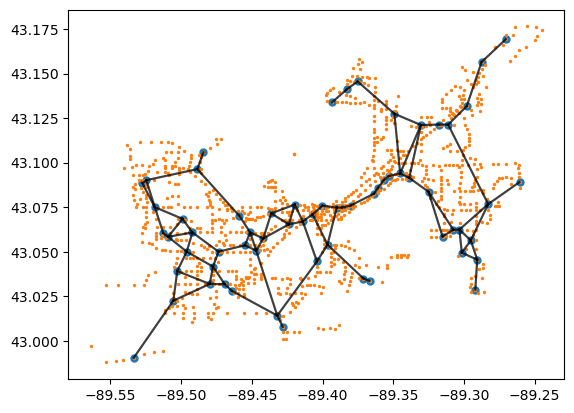

┌ Warning: `vendor()` is deprecated, use `BLAS.get_config()` and inspect the output instead
│   caller = npyinitialize() at numpy.jl:67
└ @ PyCall /Users/ankurgarg/.julia/packages/PyCall/L0fLP/src/numpy.jl:67


In [36]:
graphModel(m, inters_)
X = round.(intersectionRidership_[!, :X], digits = 6)
Y = round.(intersectionRidership_[!, :Y], digits = 6)
scatter(X, Y, s=2);

In [55]:
# To improve runtime, sample a subset of the intersections
filteredRouteRidership_ = filter(:X => x -> -89.4 <=  x <= -89.35, routeRidership_)
filteredRouteRidership_ = filter(:Y => x ->  43.0625 <=  x <= 43.075, filteredRouteRidership_)

m2,inters_2 = parse_create_model(filteredRouteRidership_, stopRidership_, intersectionRidership_);

In [56]:
optimize!(m2)
solution_summary(m2)

* Solver : Clp

* Status
  Termination status : OPTIMAL
  Primal status      : FEASIBLE_POINT
  Dual status        : FEASIBLE_POINT
  Message from the solver:
  "0 - optimal"

* Candidate solution
  Objective value      : 1.1867774871308718

* Work counters
  Solve time (sec)   : 0.62033


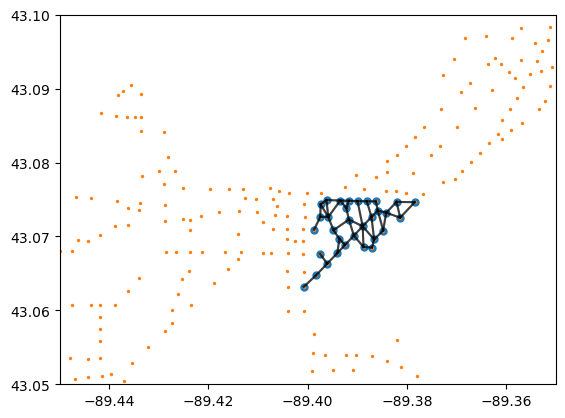

(-89.45, -89.35, 43.05, 43.1)

In [42]:
graphModel(m2,inters_2)
X = round.(intersectionRidership_[!,:X],digits = 6)
Y = round.(intersectionRidership_[!,:Y],digits = 6)
scatter(X,Y,s=2);
axis([-89.45, -89.35, 43.05, 43.1]);

## 4. Results and discussion ##

For the first and larger subset of our data, the following image overlays our solution set of nodes and edges onto the map of Madison as obtained from Google Earth.

<div>
   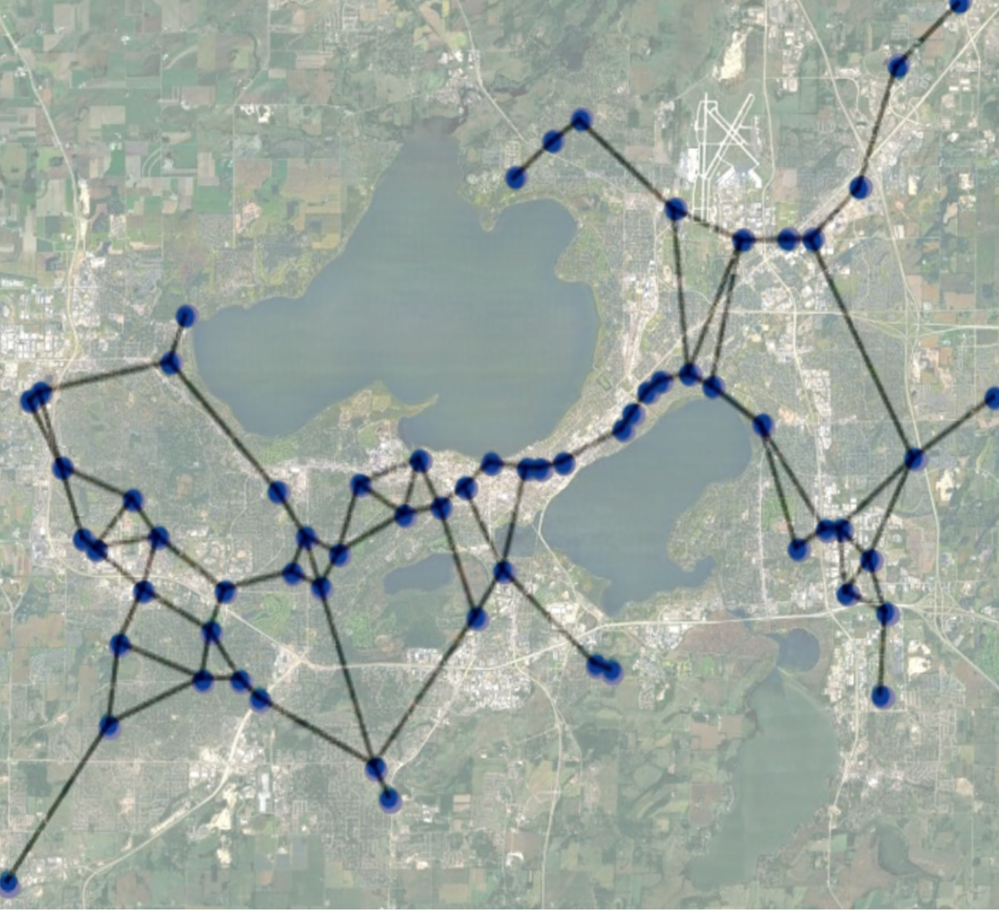
</div>

And the following image overlays our solution set of nodes and edges for the second smaller set onto another smaller subset of the map of Madison again obtained from Google Earth.

<div>
   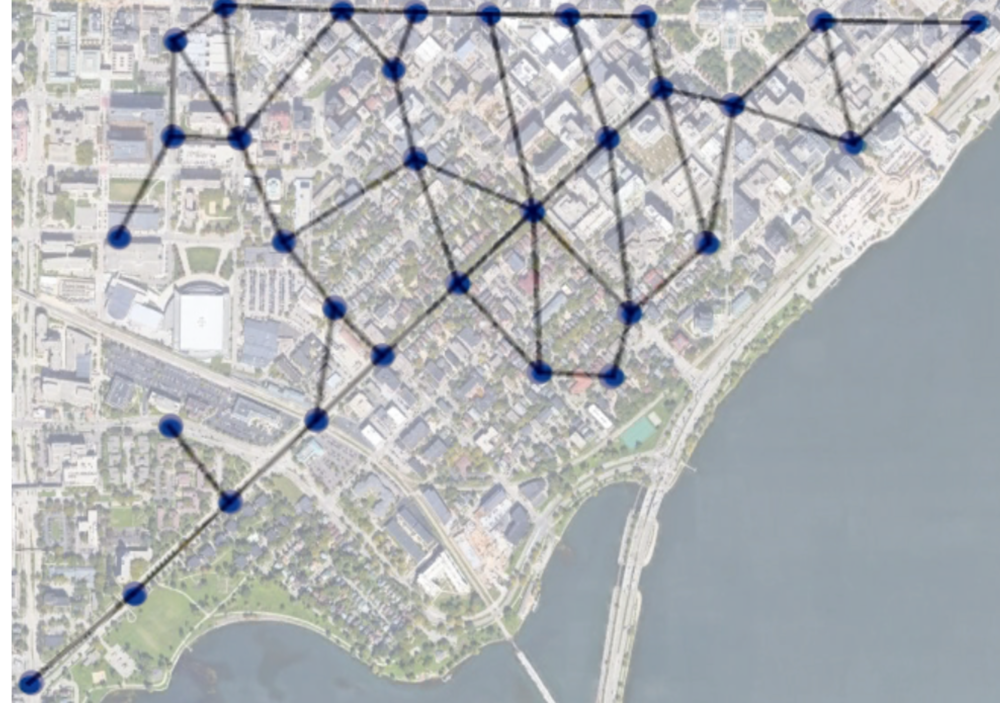
</div>

These two images come out as a solution of our formulation of the minimum cost problem. They show what the optimal bus-routes from one stop to another to ensure the least travel-time for passengers and maximizing the passenger flow Madison Metro Bus Transit, for the two subsets of the data we look at. 

The correct way to interpret these results would be that from all the bus stops, routes and intersections that Madison metro currently has in the given subsets of the data we have chosen, the overlayed graph shows which stops and routes would be the best to include in the new plan. These solutions graphs are based on the current trends seen with the popularity of routes based on passenger boarding, and under the objective to minimize the travel time based on distance and cost optimization for the Madison Metro Transit authorities.

*****

There are some limitations to our model which we would love to work on if we had more time and data available. One of them is that currently our data only looks at weekday trends and not weekend. The reaosn we had to move forward with this limitation was that we could only find data for routes, intersections and stops for weekdays, and not all for weekends as well. If we could though, we'd aggregate the data and work on a model that takes into account weekend trends as well.

*****

One key assumption we made while modeling this bus route optimization problem was to assume that the number of poeple that get off the bus are proportionate to the number of people that get on at that particular stop. We had to do that because there wasn't data available for us to know exactly how many people are getting off at each stop and use that to estimate travel patterns. Our model however, we like to think wouldn't be that sensitive to this assumption because it is rarely the case to have a lot of people getting off at a particular bus stop but not a proportionate number of people getting on from it, because they'd be likely get onto the bus again from there itself. Similarly, we can say the same for stops where very few people get off. So our assumption might not actually be something that affects our model too much.

## 5. Conclusion ##

Looking at the results we obtain from the formulation of the problem above, we come to some interesting and useful conclusions, even though we could run our model only on a subset of the routes, stops and intersections due to limited computational capabilities.

For both of our subsets, we see notice how not every route that currently exists is the optimal one based on the current passenger trends and distances between stops and intersections. Rather, there exists a better subset of these that would be a better option for Madison Metro to consider including in their new Bus Transit plan for 2023 which would lead to better travel times for passengers based on which routes are the most popular and and also optimize their costs as the authority by minimizing them.

One future direction we want to be looking at is to take into account that some routes just cannot be made to exist given the outline of the city. For example, maybe a new route from stop A to stop C ignores stop B and is considered as the optimal route by our model. But it might be the case that the way the city roads are structured and designated, the direct route from stop A to stop C doesn't exist because of being a one-way route in the other direction. So that would be something interesting to take into account, but we realize that would require some more and other kinds of data as well. Another possibility we'd like to explore was to run our model on the entire size of the datasets but we would require a lot more computational capability for that and we realize that might not be possible with simple systems like we have with ourselves for school.

## Author Contributions

#### 1. Modelling  
Agam: 33.33 %  
Ankur: 33.33 %  
Erik: 33.33 % 

  
#### 2. Analysis  
Agam: 33.33 %  
Ankur: 33.33 %  
Erik: 33.33 %  


#### 3. Data Gathering  
Agam: 33.33 %  
Ankur: 33.33 %  
Erik: 33.33 % 


#### 4. Software Implementation  
Agam: 33.33 %  
Ankur: 33.33 %  
Erik: 33.33 %  


#### 5. Report writing and poster presentation   
Agam: 33.33 %  
Ankur: 33.33 %  
Erik: 33.33 %